In [1]:
pip install gap-stat

# About the Data

The dataset captures transactions from December 2009 to December 2011 from a UK-based online retailer. Fields include:
- InvoiceNo - Invoice number - a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter ‘c’, it indicates a cancellation.
- StockCode - a 5-digit integral number uniquely assigned to each distinct product
- Description - product name
- Quantity - the quantities of each product (item) per transaction
- InvoiceDate - the day and time when each transaction was generated
- UnitPrice - product price per unit
- CustomerID - a 5-digit integral number uniquely assigned to each customer
- Country - the name of the country where each customer resides
For more details about the dataset, refer to the UCI Machine Learning Repository.

The project is structured into two main parts: 

**1. EDA (Exploratory Data Analysis) and Extraction of Business Insights:**

- Identify the most frequently purchased products.
- Calculate the average price per order.
- Analyze overall sales trends throughout the quarters.
- Determine the distribution of order sizes per invoice.
- Explore the preferred shopping days during the week.
- Identify countries most represented in the dataset.
- Examine revenue by country.
- Calculate monthly revenue and determine the percentage revenue based on countries.
- Identify the month with the highest sales.
- Analyze popular products and their sales variation over time.
- Investigate the impact of cancellations on overall sales trends.

**2. Customer Segmentation using RFM Analysis:**

- Utilize RFM (Recency, Frequency, Monetary) analysis to segment customers based on their purchase patterns.
- Characterize and quantify customer personas based on their RFM profiles.

This comprehensive approach will help uncover valuable insights into product popularity, sales trends, and customer segmentation, providing a holistic understanding of the dataset.

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import requests
import plotly.express as px
import missingno as msno
import warnings
import scipy.stats as stats


from io import StringIO
from sklearn.preprocessing import LabelEncoder
from datetime import datetime
from tqdm import tqdm


label_encoder = LabelEncoder()
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings('ignore')

In [4]:
data1=pd.read_csv('/content/Online Retail.csv')
data2=pd.read_csv('/content/online_retail_II.csv')

In [5]:
display(data1.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [6]:
display(data2.head())

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,12/1/2009 7:45,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,12/1/2009 7:45,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,12/1/2009 7:45,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,12/1/2009 7:45,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,12/1/2009 7:45,1.25,13085.0,United Kingdom


# Understaning the data

In [7]:
print(f'''Data1 Column names
{data1.columns}
-------------------------
Data2 Column names:
{data2.columns}''')

Data1 Column names
Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')
-------------------------
Data2 Column names:
Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country'],
      dtype='object')


In [8]:
# Renaming Column names
column_mapping = {
    'Invoice': 'InvoiceNo',
    'Price': 'UnitPrice',
    'Customer ID': 'CustomerID',
}

data2.rename(columns=column_mapping, inplace=True)

print(data2.columns)

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')


In [9]:
data = pd.merge(data1, data2, how='outer')
print(f'''Data1 Shape:{data1.shape},
Data2 Shape:{data2.shape},
Data Shape:{data.shape}''')

Data1 Shape:(541909, 8),
Data2 Shape:(525461, 8),
Data Shape:(1045545, 8)


In [10]:
def table_summary(data):
    summary_data = []

    for column in data.columns:
        num_unique_values = data[column].nunique()
        num_empty_values = data[column].isnull().sum()
        data_type = data[column].dtypes
        percentage_empty = (num_empty_values / len(data)) * 100
        summary_data.append([column, num_unique_values, num_empty_values, percentage_empty, data_type])

    summary_df = pd.DataFrame(summary_data, columns=['Column Name', 'Unique Values', 'Empty Values', 'Percentage Empty', 'Data Type'])

    print(f'''Table Summary
Dataframe Shape: {data.shape}''')


    display(summary_df)
    msno.matrix(data)
    plt.title('Missing Values Overview', fontsize=16)
    plt.xlabel('Columns', fontsize=14)
    plt.ylabel('Percentage of Missing Values', fontsize=14)
    plt.show()

Table Summary
Dataframe Shape: (1045545, 8)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,53628,0,0.000000,object
1,StockCode,5305,0,0.000000,object
2,Description,5698,4275,0.408878,object
3,Quantity,1057,0,0.000000,int64
4,InvoiceDate,47635,0,0.000000,object
5,UnitPrice,2807,0,0.000000,float64
6,CustomerID,5942,235289,22.503957,float64
7,Country,43,0,0.000000,object


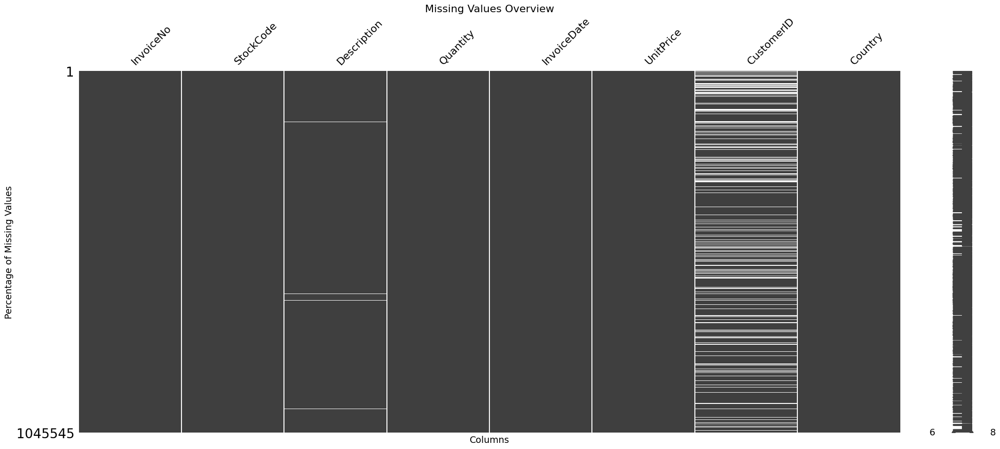

In [11]:
table_summary(data)

# Data Cleaning

We have missing values in the `Description` column. Initially, I'll examine whether these missing values are associated with valid `StockCode` entries and determine if there are corresponding descriptions for those `StockCode` entries.

In [12]:
desc_nan=data[data['Description'].isnull()]
display(desc_nan.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
658,536414,22139,NaN,56,12/1/2010 11:52,0.0,NaN,United Kingdom
2046,536545,21134,NaN,1,12/1/2010 14:32,0.0,NaN,United Kingdom
2047,536546,22145,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
2048,536547,37509,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
2063,536549,85226A,NaN,1,12/1/2010 14:34,0.0,NaN,United Kingdom


In [13]:
# getting the list of unique StockCode from desc_nan dataset
stockcodes_list = list(desc_nan['StockCode'].unique())

# filtering the 'data' dataset containing only the StockCode from stockcodes_list
mask = data['StockCode'].isin(stockcodes_list)
filtered_data = data[mask]

# Display the rows with StockCodes in the list and non-null Descriptions
display(filtered_data.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,12/1/2010 8:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,12/1/2010 8:26,4.25,17850.0,United Kingdom


In [14]:
filtered_data.shape

(375540, 8)

In [15]:
# Fill missing values in the 'Description' column by replacing them with the available descriptions associated with the respective 'StockCode' if such descriptions exist.

# Identify unique StockCodes where Description is NaN
missing_description_stockcodes = desc_nan['StockCode'].unique()

# go through each StockCodes
for stockcode in tqdm(missing_description_stockcodes):
    # Check if there are non-null Descriptions for the current StockCode
    non_null_descriptions = data[data['StockCode'] == stockcode]['Description'].dropna()

    if not non_null_descriptions.empty:
        # If non-null Descriptions exist, fill in missing values with the first non-null Description
        fill_value = non_null_descriptions.iloc[0]
        condition = (data['StockCode'] == stockcode) & (data['Description'].isnull())
        data.loc[condition, 'Description'] = fill_value

100%|██████████| 2451/2451 [05:57<00:00,  6.86it/s]


In [16]:
def count_unique_values(data, columns):
    summary_data = []
    for column in columns:
        num_unique_values = data[column].nunique()
        summary_data.append([column, num_unique_values])
    summary_df = pd.DataFrame(summary_data, columns=['Column Name', 'Unique Values'])
    display(summary_df)
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5305
1,Description,5698


In [17]:
# Group by 'StockCode' and count the unique 'Description' values
stockcode_description_counts = data.groupby('StockCode')['Description'].nunique()

# Filter StockCodes with more than one unique Description
stockcodes_with_multiple_descriptions = stockcode_description_counts[stockcode_description_counts > 1].index.tolist()

In [18]:
# Filter rows with StockCodes having more than one unique Description
multiple_description_stockcodes = stockcode_description_counts[stockcode_description_counts > 1].index

# Create a DataFrame containing StockCodes with multiple Descriptions
multiple_description_data = data[data['StockCode'].isin(multiple_description_stockcodes)]

# Group by 'StockCode' and collect unique 'Description' values
stockcode_descriptions_multiple = multiple_description_data.groupby('StockCode')['Description'].unique().reset_index()

# Display the result
display(stockcode_descriptions_multiple.head())

,StockCode,Description
0,10080,"[GROOVY CACTUS INFLATABLE, check]"
1,10120,"[DOGGY RUBBER, Zebra invcing error]"
2,10133,"[COLOURING PENCILS BROWN TUBE, damaged]"
3,15056N,"[EDWARDIAN PARASOL NATURAL, wedding co returns?]"
4,15058A,"[BLUE POLKADOT GARDEN PARASOL, wet/rusty, BLUE..."


In [19]:
# Iterate through StockCodes with multiple Descriptions
for stockcode in stockcodes_with_multiple_descriptions:
    # Get the first Description for the current StockCode
    first_description = data[data['StockCode'] == stockcode]['Description'].dropna().iloc[0]

    # Replace all Descriptions for the current StockCode with the first one
    data.loc[data['StockCode'] == stockcode, 'Description'] = first_description

In [20]:
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5305
1,Description,4743


In [21]:
# Filter rows with StockCodes having more than one unique Description
multiple_description_stockcodes = stockcode_description_counts[stockcode_description_counts > 1].index

# Create a DataFrame containing StockCodes with multiple Descriptions
multiple_description_data = data[data['StockCode'].isin(multiple_description_stockcodes)]

# Group by 'StockCode' and collect unique 'Description' values
stockcode_descriptions_multiple = multiple_description_data.groupby('StockCode')['Description'].unique().reset_index()

# Display the result
display(stockcode_descriptions_multiple.head())

,StockCode,Description
0,10080,[GROOVY CACTUS INFLATABLE]
1,10120,[DOGGY RUBBER]
2,10133,[COLOURING PENCILS BROWN TUBE]
3,15056N,[EDWARDIAN PARASOL NATURAL]
4,15058A,[BLUE POLKADOT GARDEN PARASOL]


In [22]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())

,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [23]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())

,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [24]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())

# Iterate through rows with multiple StockCodes for a Description
for index, row in description_stockcodes_multiple.iterrows():
    # Get the first StockCode for the current Description
    first_stockcode = row['StockCode'][0]

    # Replace all StockCodes for the current Description with the first one
    data.loc[data['Description'] == row['Description'], 'StockCode'] = first_stockcode


,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [25]:
# Display the result
display(description_stockcodes_multiple.head())

,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [26]:
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5098
1,Description,4743


Table Summary
Dataframe Shape: (1045545, 8)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,53628,0,0.000000,object
1,StockCode,5098,0,0.000000,object
2,Description,4743,363,0.034719,object
3,Quantity,1057,0,0.000000,int64
4,InvoiceDate,47635,0,0.000000,object
5,UnitPrice,2807,0,0.000000,float64
6,CustomerID,5942,235289,22.503957,float64
7,Country,43,0,0.000000,object


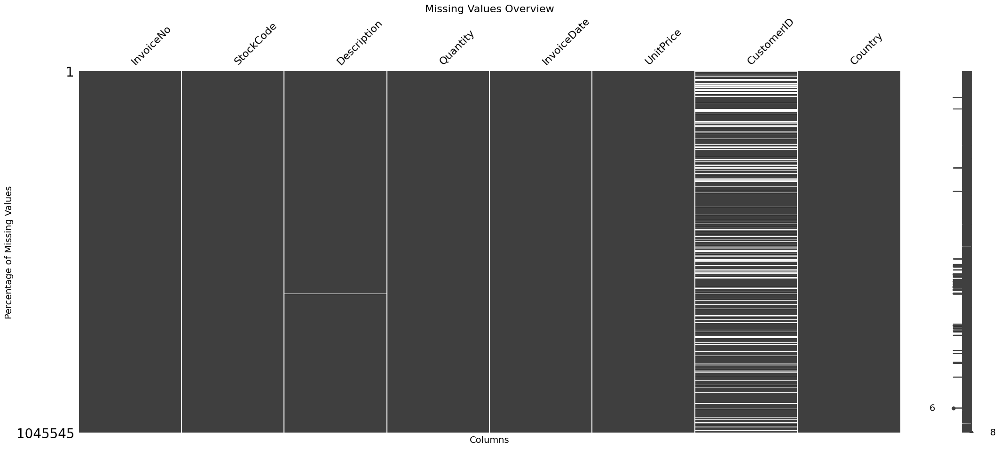

In [27]:
table_summary(data)

In [28]:
# there are still Missing values in Description, So i'll be dropping them
data = data.dropna(subset=['Description'])

In [29]:
data['Description'] = data['Description'].str.title()

In [30]:
data.shape

(1045182, 8)

# Preprocessing

In [31]:
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

# Extract Year, Quarter, Month, Week, and Day
data['Year'] = data['InvoiceDate'].dt.year
data['Quarter'] = data['InvoiceDate'].dt.quarter
data['Month'] = data['InvoiceDate'].dt.month
data['Week'] = data['InvoiceDate'].dt.isocalendar().week
data['Day'] = data['InvoiceDate'].dt.day
data['TotalPrice']=data['Quantity']*data['UnitPrice']
data['YearQuarter'] = data['InvoiceDate'].dt.to_period("Q")
data['YearMonth'] = data['InvoiceDate'].dt.to_period("M")
data['Date'] = data['InvoiceDate'].dt.date
data['DayOfWeek'] = data['InvoiceDate'].dt.day_name()

In [32]:
total_duplicates = data.duplicated(keep=False).sum()

# Display the total number of duplicate rows
print("Total Number of Duplicates:", total_duplicates)

Total Number of Duplicates: 24920


In [33]:
data=data.drop_duplicates(keep='first')

Although there are approximately 22% missing values in the `CustomerID` field, it's important to note that these entries contribute to the generated income. Therefore, I will retain these values for my analysis

In [34]:
# For analysis purposes, I'm filling the null values in the 'CustomerID' column with '00000' to ensure completeness of the data.
data['CustomerID'] = data['CustomerID'].fillna('00000')
data['CustomerID'] = data['CustomerID'].astype('int64')

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031929 entries, 0 to 1045544
Data columns (total 18 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   InvoiceNo    1031929 non-null  object        
 1   StockCode    1031929 non-null  object        
 2   Description  1031929 non-null  object        
 3   Quantity     1031929 non-null  int64         
 4   InvoiceDate  1031929 non-null  datetime64[ns]
 5   UnitPrice    1031929 non-null  float64       
 6   CustomerID   1031929 non-null  int64         
 7   Country      1031929 non-null  object        
 8   Year         1031929 non-null  int64         
 9   Quarter      1031929 non-null  int64         
 10  Month        1031929 non-null  int64         
 11  Week         1031929 non-null  UInt32        
 12  Day          1031929 non-null  int64         
 13  TotalPrice   1031929 non-null  float64       
 14  YearQuarter  1031929 non-null  period[Q-DEC] 
 15  YearMonth    10

In [36]:
data.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
count,1031929,1031929,1031929,1.031929e+06,1031929,1.031929e+06,1.031929e+06,1031929,1.031929e+06,1.031929e+06,1.031929e+06,1031929.0,1.031929e+06,1.031929e+06,1031929,1031929,1031929,1031929
unique,53265,4743,4740,NaN,47451,NaN,NaN,43,NaN,NaN,NaN,<NA>,NaN,NaN,9,25,604,7
top,573585,85123A,White Hanging Heart T-Light Holder,NaN,2011-10-31 14:41:00,NaN,NaN,United Kingdom,NaN,NaN,NaN,<NA>,NaN,NaN,2010Q4,2011-11,2011-12-05,Thursday
freq,1114,5752,5752,NaN,1114,NaN,NaN,947263,NaN,NaN,NaN,<NA>,NaN,NaN,176778,83261,5290,195961
first,NaN,NaN,NaN,NaN,2009-12-01 07:45:00,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2011-12-09 12:50:00,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,1.009616e+01,NaN,4.616598e+00,1.183130e+04,NaN,2.010436e+03,2.786267e+00,7.394530e+00,30.054866,1.534869e+01,1.825673e+01,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,1.751800e+02,NaN,1.224631e+02,6.589141e+03,NaN,5.764536e-01,1.144788e+00,3.500319e+00,15.175768,8.642581e+00,2.958430e+02,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,-8.099500e+04,NaN,-5.359436e+04,0.000000e+00,NaN,2.009000e+03,1.000000e+00,1.000000e+00,1.0,1.000000e+00,-1.684696e+05,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,1.000000e+00,NaN,1.250000e+00,1.253000e+04,NaN,2.010000e+03,2.000000e+00,4.000000e+00,17.0,8.000000e+00,3.750000e+00,NaN,NaN,NaN,NaN


There are negative values in Quantity. Most of the negative values are Cancelled orders. However, there are values where InvoiceNo number does not contain 'C'

In [37]:
# cancelled=data[data['InvoiceNo'].astype(str).str.contains('C')]

In [38]:
cancelled=data[data['InvoiceNo'].astype(str).str.contains('C')]
filtered_data = data[~data['InvoiceNo'].astype(str).str.contains('C')]

In [39]:
cancelled.shape

(19076, 18)

In [40]:
display(cancelled.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527,United Kingdom,2010,4,12,48,1,-27.50,2010Q4,2010-12,2010-12-01,Wednesday
154,C536383,35004C,Set Of 3 Coloured Flying Ducks,-1,2010-12-01 09:49:00,4.65,15311,United Kingdom,2010,4,12,48,1,-4.65,2010Q4,2010-12,2010-12-01,Wednesday
235,C536391,22556,Plasters In Tin Circus Parade,-12,2010-12-01 10:24:00,1.65,17548,United Kingdom,2010,4,12,48,1,-19.80,2010Q4,2010-12,2010-12-01,Wednesday
236,C536391,21984,Pack Of 12 Pink Paisley Tissues,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom,2010,4,12,48,1,-6.96,2010Q4,2010-12,2010-12-01,Wednesday
237,C536391,21983,Pack Of 12 Blue Paisley Tissues,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom,2010,4,12,48,1,-6.96,2010Q4,2010-12,2010-12-01,Wednesday


In [41]:
cancelled['Quantity'].max()

1

In [42]:
cancelled[cancelled['Quantity']>0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
619406,C496350,M,Manual,1,2010-02-01 08:24:00,373.57,0,United Kingdom,2010,1,2,5,1,373.57,2010Q1,2010-02,2010-02-01,Monday


In [43]:
filtered_data = data[~data['InvoiceNo'].astype(str).str.contains('C')]

In [44]:
filtered_data[filtered_data['Quantity']<0].head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
2498,536589,21777,Recipe Box With Metal Heart,-10,2010-12-01 16:50:00,0.0,0,United Kingdom,2010,4,12,48,1,-0.0,2010Q4,2010-12,2010-12-01,Wednesday
4477,536764,84952C,Mirror Love Bird T-Light Holder,-38,2010-12-02 14:42:00,0.0,0,United Kingdom,2010,4,12,48,2,-0.0,2010Q4,2010-12,2010-12-02,Thursday
7404,536996,22712,Card Dolly Girl,-20,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday
7405,536997,22028,Penny Farthing Birthday Card,-20,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday
7406,536998,85067,Cream Sweetheart Wall Cabinet,-6,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday


In [45]:
filtered_data.shape

(1012853, 18)

In [46]:
filtered_data['UnitPrice'].nunique()

2280

In [47]:
# 1012853
filtered_data['InvoiceNo'].nunique()

44973

In [48]:
# We can see there are some outliers in the TotalPrice column,
fig = px.box(filtered_data, x='TotalPrice')
fig.show()

In [49]:
# We can see there are some outliers in the TotalPrice column,
fig = px.box(filtered_data, x='Quantity')
fig.show()

There are over 1000k observations with negative quantities, and notably, all these orders are placed by customers with missing `CustomerID` values.

In [50]:
# We can see there are some outliers in the TotalPrice column,
fig = px.box(filtered_data, x='UnitPrice')
fig.show()

In [51]:
import pandas as pd

# Assuming you have a DataFrame named 'data'
# Columns: 'Quantity', 'UnitPrice', 'TotalPrice'

# Function to remove outliers based on IQR
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Remove outliers for each relevant column
no_outliers = remove_outliers_iqr(filtered_data, 'Quantity')
no_outliers = remove_outliers_iqr(filtered_data, 'UnitPrice')
no_outliers = remove_outliers_iqr(filtered_data, 'TotalPrice')

# Display the resulting DataFrame
display(no_outliers.head())


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,2010,4,12,48,1,15.30,2010Q4,2010-12,2010-12-01,Wednesday
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,2010,4,12,48,1,22.00,2010Q4,2010-12,2010-12-01,Wednesday
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday


In [52]:
no_outliers.shape

(929013, 18)

In [53]:
# df=data[~data['InvoiceNo'].astype(str).str.contains('C') & data['Quantity']>0]
df=no_outliers

In [54]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,2010,4,12,48,1,15.30,2010Q4,2010-12,2010-12-01,Wednesday
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,2010,4,12,48,1,22.00,2010Q4,2010-12,2010-12-01,Wednesday
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929013 entries, 0 to 1045542
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    929013 non-null  object        
 1   StockCode    929013 non-null  object        
 2   Description  929013 non-null  object        
 3   Quantity     929013 non-null  int64         
 4   InvoiceDate  929013 non-null  datetime64[ns]
 5   UnitPrice    929013 non-null  float64       
 6   CustomerID   929013 non-null  int64         
 7   Country      929013 non-null  object        
 8   Year         929013 non-null  int64         
 9   Quarter      929013 non-null  int64         
 10  Month        929013 non-null  int64         
 11  Week         929013 non-null  UInt32        
 12  Day          929013 non-null  int64         
 13  TotalPrice   929013 non-null  float64       
 14  YearQuarter  929013 non-null  period[Q-DEC] 
 15  YearMonth    929013 non-null  per

In [56]:
df.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
count,929013,929013,929013,929013.000000,929013,929013.000000,929013.000000,929013,929013.000000,929013.000000,929013.000000,929013.0,929013.000000,929013.000000,929013,929013,929013,929013
unique,40934,4726,4723,NaN,36964,NaN,NaN,43,NaN,NaN,NaN,<NA>,NaN,NaN,9,25,604,7
top,573585,85123A,White Hanging Heart T-Light Holder,NaN,2011-10-31 14:41:00,NaN,NaN,United Kingdom,NaN,NaN,NaN,<NA>,NaN,NaN,2010Q4,2011-11,2011-12-05,Thursday
freq,1043,4313,4313,NaN,1043,NaN,NaN,862648,NaN,NaN,NaN,<NA>,NaN,NaN,159497,76140,4883,174284
first,NaN,NaN,NaN,NaN,2009-12-01 07:45:00,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2011-12-09 12:50:00,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,5.894635,NaN,3.178770,11645.601221,NaN,2010.437814,2.788893,7.400598,30.080749,15.359503,10.603047,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,52.210587,NaN,3.316323,6731.115156,NaN,0.576038,1.145832,3.503023,15.187982,8.649268,8.327888,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,-9600.000000,NaN,0.000000,0.000000,NaN,2009.000000,1.000000,1.000000,1.0,1.000000,-0.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,1.000000,NaN,1.250000,12437.000000,NaN,2010.000000,2.000000,4.000000,17.0,8.000000,3.750000,NaN,NaN,NaN,NaN


Table Summary
Dataframe Shape: (929013, 18)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,40934,0,0.0,object
1,StockCode,4726,0,0.0,object
2,Description,4723,0,0.0,object
3,Quantity,676,0,0.0,int64
4,InvoiceDate,36964,0,0.0,datetime64[ns]
5,UnitPrice,618,0,0.0,float64
6,CustomerID,5669,0,0.0,int64
7,Country,43,0,0.0,object
8,Year,3,0,0.0,int64
9,Quarter,4,0,0.0,int64


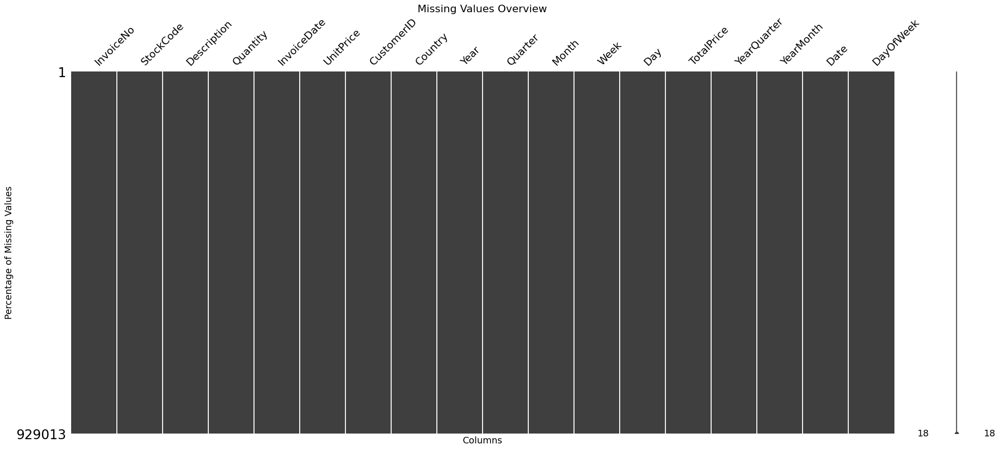

In [57]:
table_summary(df)

In [58]:
# EDA

In [59]:
# How many orders have been placed in total
print(f"There are {df['InvoiceNo'].nunique()} Orders in this Dataset")

There are 40934 Orders in this Dataset


In [60]:
# Find the number of items per order
product_counts = data.groupby('InvoiceNo')['StockCode'].count().reset_index()
display(product_counts.head())

,InvoiceNo,StockCode
0,489434,8
1,489435,4
2,489436,19
3,489437,23
4,489438,17


In [61]:
# Finding the order size
avg_size_per_invoice = df.groupby('InvoiceNo')['StockCode'].count().mean()
print(f'Avg Basket Size per order is {avg_size_per_invoice}')

Avg Basket Size per order is 22.695387697268774


In [62]:
# Finding the totalCost per order
totalCost_counts = df.groupby('InvoiceNo')['TotalPrice'].sum().reset_index()
display(totalCost_counts.head())

,InvoiceNo,TotalPrice
0,489434,60.00
1,489435,61.20
2,489436,260.69
3,489437,310.75
4,489438,61.94


In [63]:
# Finding the avg totalCost per order
avg_cost_per_invoice = df.groupby('InvoiceNo')['TotalPrice'].sum().mean()
print(f'Avg Cost per order is {avg_cost_per_invoice}')

Avg Cost per order is 240.64027282943272


In [64]:
# Finding top 10 products
top_10=df.groupby(['StockCode','Description']).agg({'InvoiceNo':'count'}).sort_values(by='InvoiceNo', ascending=False)
top_10.head(10)

,,InvoiceNo
StockCode,Description,
85123A,White Hanging Heart T-Light Holder,4313
85099B,Jumbo Bag Red Retrospot,3009
21212,Pack Of 72 Retrospot Cake Cases,2881
20725,Lunch Bag Red Retrospot,2781
23202,Mailout,2516
22423,Regency Cakestand 3 Tier,2351
22383,Lunch Bag Suki Design,2264
20727,Lunch Bag Black Skull.,2232
21232,Strawberry Ceramic Trinket Box,2198


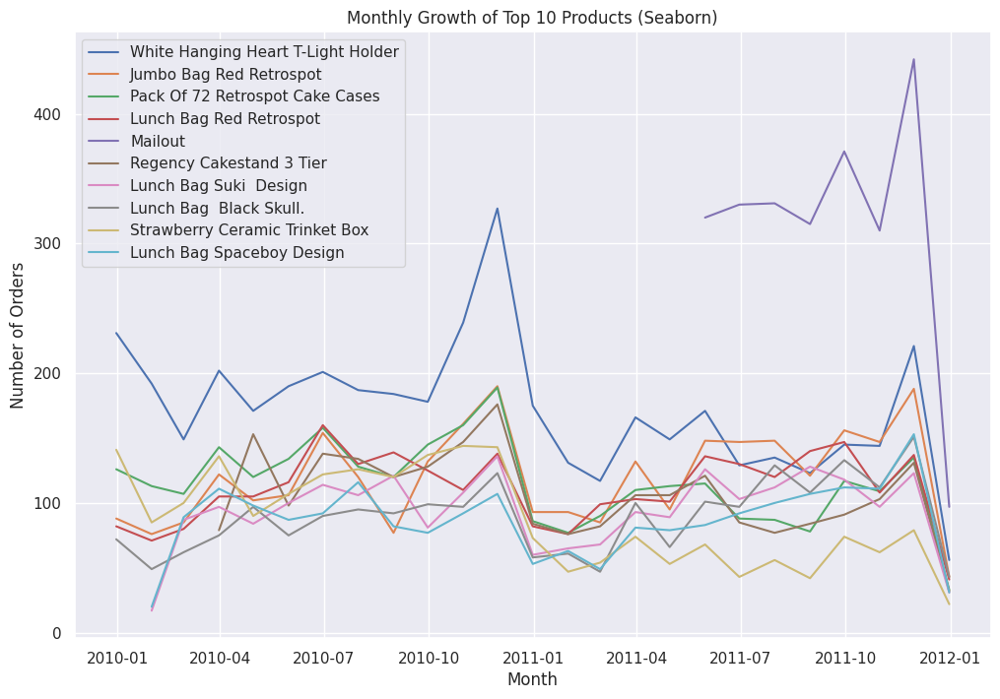

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df'
# Columns: 'StockCode', 'Description', 'InvoiceNo', 'InvoiceDate'

# Group by 'Description' and 'InvoiceDate', count 'InvoiceNo' for each month
monthly_counts = df.groupby(['Description', pd.Grouper(key='InvoiceDate', freq='M')])['InvoiceNo'].count().reset_index()

# Filter data for the top 10 products based on Description
top_products = df.groupby('Description')['InvoiceNo'].count().sort_values(ascending=False).head(10).index

# Set the plotting style
sns.set(style="darkgrid")

# Plotting individual growth for each of the top 10 products using Seaborn
plt.figure(figsize=(12, 8))
for product in top_products:
    product_data = monthly_counts[monthly_counts['Description'] == product]
    sns.lineplot(x=product_data['InvoiceDate'], y=product_data['InvoiceNo'], label=f'{product}')

plt.xlabel('Month')
plt.ylabel('Number of Orders')
plt.title('Monthly Growth of Top 10 Products (Seaborn)')
plt.legend()
plt.show()


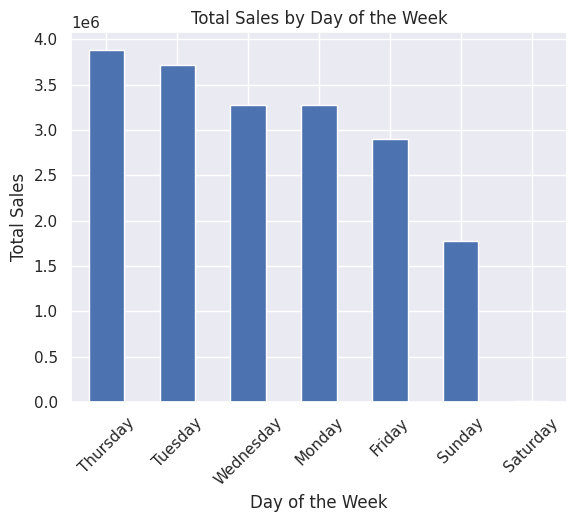

In [66]:
# Fing the day with the highest purchase

# Group by day of the week, then calculate total sales and sort
total_cost_per_day = df.groupby(['DayOfWeek'])['TotalPrice'].sum().reset_index()
total_cost_per_day = total_cost_per_day.sort_values(by='TotalPrice', ascending=False)

# Plot the bar chart
ax = total_cost_per_day.plot(kind='bar', x='DayOfWeek', y='TotalPrice', legend=False, rot=45)

# Set title, x-axis label, and y-axis label
plt.title('Total Sales by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales')

# Display the plot
plt.show()


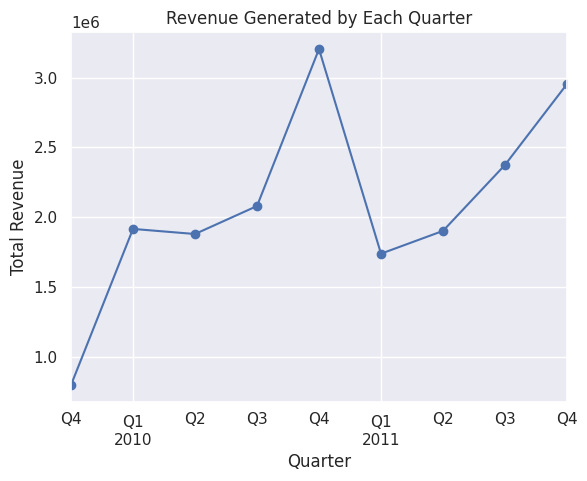

In [67]:
# Revenue Generated by Each Quarter
# Assuming 'YearQuarter' is the column representing the quarter
revenue_by_quarter = df.groupby('YearQuarter')['TotalPrice'].sum().reset_index()

# Plot the line chart
ax = revenue_by_quarter.plot(kind='line', x='YearQuarter', y='TotalPrice', marker='o', linestyle='-', color='b', legend=False)

# Set title, x-axis label, and y-axis label
plt.title('Revenue Generated by Each Quarter')
plt.xlabel('Quarter')
plt.ylabel('Total Revenue')

# Display the plot
plt.show()


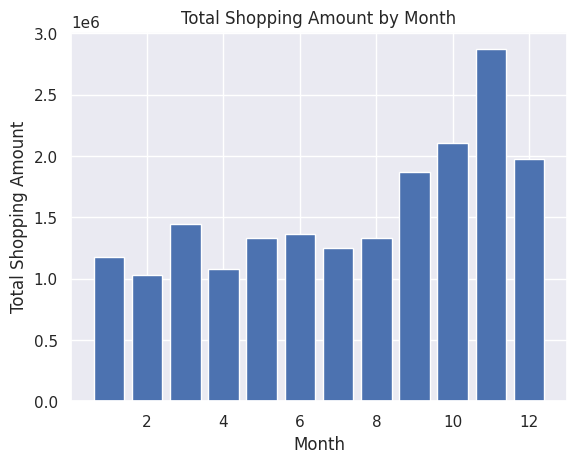

In [68]:

shopping_by_month = df.groupby('Month')['TotalPrice'].sum().reset_index()

# Plot the bar chart
plt.bar(shopping_by_month['Month'], shopping_by_month['TotalPrice'])

# Set title, x-axis label, and y-axis label
plt.title('Total Shopping Amount by Month')
plt.xlabel('Month')
plt.ylabel('Total Shopping Amount')

# Display the plot
plt.show()


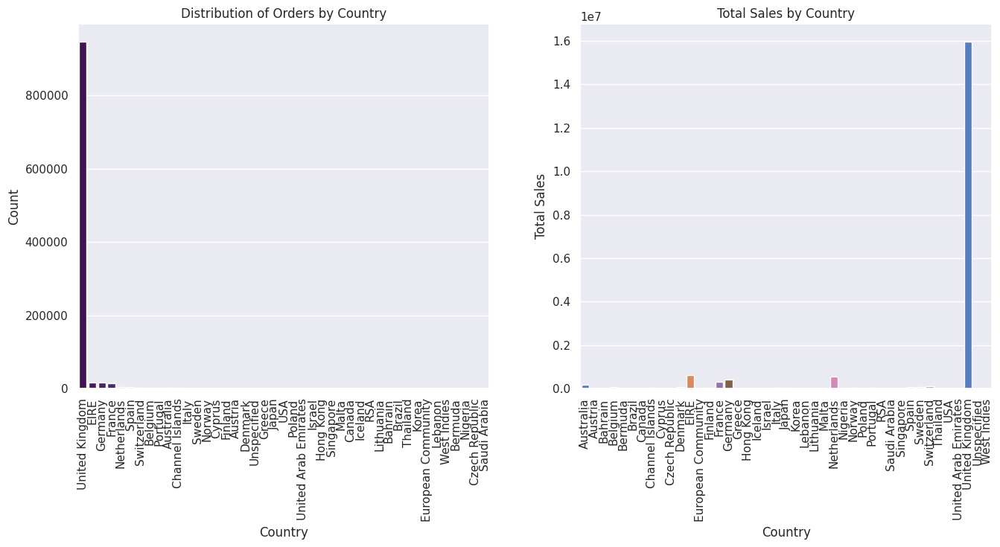

In [69]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plot 1: Country distribution
sns.countplot(x='Country', data=df, ax=axes[0], order=data['Country'].value_counts().index, palette='viridis')
axes[0].set_title('Distribution of Orders by Country')
axes[0].set_xlabel('Country')
axes[0].set_ylabel('Count')

# Plot 2: TotalPrice by Country
sns.barplot(x='Country', y='TotalPrice', data=df.groupby('Country')['TotalPrice'].sum().reset_index(), ax=axes[1], palette='muted')
axes[1].set_title('Total Sales by Country')
axes[1].set_xlabel('Country')
axes[1].set_ylabel('Total Sales')

# Adjust layout to prevent overlapping
plt.tight_layout()

# # Rotate x-axis labels for better readability
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

# Display the subplots
plt.show()


In [70]:
# TotalPrice per Country
total_sales_by_country = df.groupby('Country')['TotalPrice'].sum().sort_values(ascending=False)
display(total_sales_by_country)

Country
United Kingdom          8748184.717
EIRE                     244410.280
Germany                  240889.031
France                   193716.510
Spain                     48184.870
Belgium                   47454.920
Switzerland               42537.230
Portugal                  32624.350
Netherlands               27601.790
Channel Islands           24706.300
Italy                     22456.440
Norway                    17948.820
Australia                 16014.340
Cyprus                    15062.320
Finland                   14758.860
Sweden                    13523.670
Austria                   13351.850
Unspecified                8967.890
Denmark                    8907.660
Greece                     8721.230
Poland                     8124.220
United Arab Emirates       7053.670
USA                        6153.740
Israel                     4865.430
Hong Kong                  4415.940
Singapore                  4111.970
Malta                      4036.450
Iceland             

In [71]:
average_order_by_country = df.groupby('Country').agg({'Quantity': 'mean', 'TotalPrice': 'mean'}).sort_values(by='TotalPrice', ascending=False)
display(average_order_by_country)


,Quantity,TotalPrice
Country,,
Czech Republic,30.133333,22.653333
Bermuda,16.000000,20.786207
Lithuania,12.609524,20.208190
Singapore,15.181373,20.156716
Lebanon,7.897436,19.355897
Hong Kong,12.150862,19.034224
Denmark,15.577167,18.832262
European Community,8.444444,18.745370
Channel Islands,10.388889,18.548273


<Figure size 1200x600 with 0 Axes>

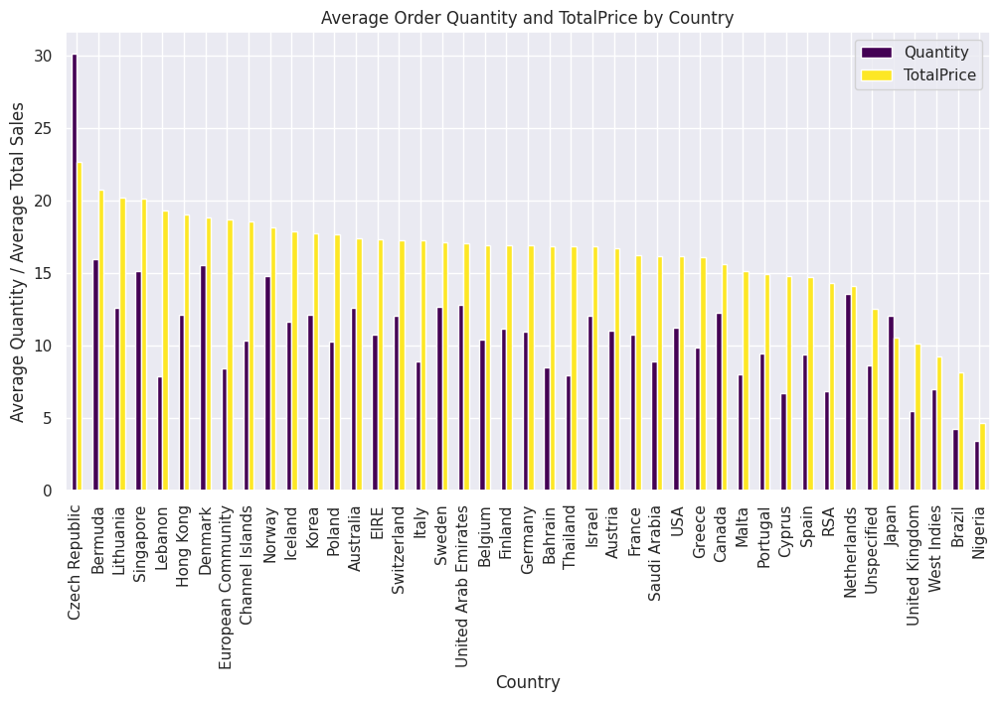

In [72]:

# Total Sales by Country - Bar Chart
plt.figure(figsize=(12, 6))

# Average Order Quantity and TotalPrice by Country - Bar Chart
average_order_by_country.plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.xlabel('Country')
plt.ylabel('Average Quantity / Average Total Sales')
plt.title('Average Order Quantity and TotalPrice by Country')
plt.show()


In [73]:
# Example: Top products purchased in each country
top_products_by_country = df.groupby(['Country', 'Description']).size().groupby('Country').idxmax().apply(lambda x: x[1])
display(top_products_by_country)


Country
Australia                           Lunch Bag Red Retrospot
Austria                                  Red Retrospot Bowl
Bahrain                   Ceramic Cake Bowl + Hanging Cakes
Belgium                                             Postage
Bermuda                   Assorted Ice Cream Fridge Magnets
Brazil                           Cook With Wine Metal Sign 
Canada                         Colouring Pencils Brown Tube
Channel Islands             Pack Of 72 Retrospot Cake Cases
Cyprus                   White Hanging Heart T-Light Holder
Czech Republic          12 Pencils Small Tube Red Retrospot
Denmark                                             Postage
EIRE                        Pack Of 72 Retrospot Cake Cases
European Community             Measuring Tape Babushka Blue
Finland                     Pack Of 72 Retrospot Cake Cases
France                                              Postage
Germany                                             Postage
Greece                        As

In [1]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with relevant columns including 'Country', 'TotalPrice', and 'InvoiceDate'
# Make sure 'InvoiceDate' is in datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Extract month and year from 'InvoiceDate'
df['YearMonth'] = df['InvoiceDate'].dt.to_period('M')

# Calculate revenue for each month
monthly_revenue = df.groupby('YearMonth')['TotalPrice'].sum().reset_index()

# Calculate percentage revenue based on countries
country_percentage_revenue = df.groupby('Country')['TotalPrice'].sum() / df['TotalPrice'].sum() * 100

# Display the results
print("Monthly Revenue:")
display(monthly_revenue)

print("\nPercentage Revenue Based on Countries:")
display(country_percentage_revenue)


NameError: name 'df' is not defined

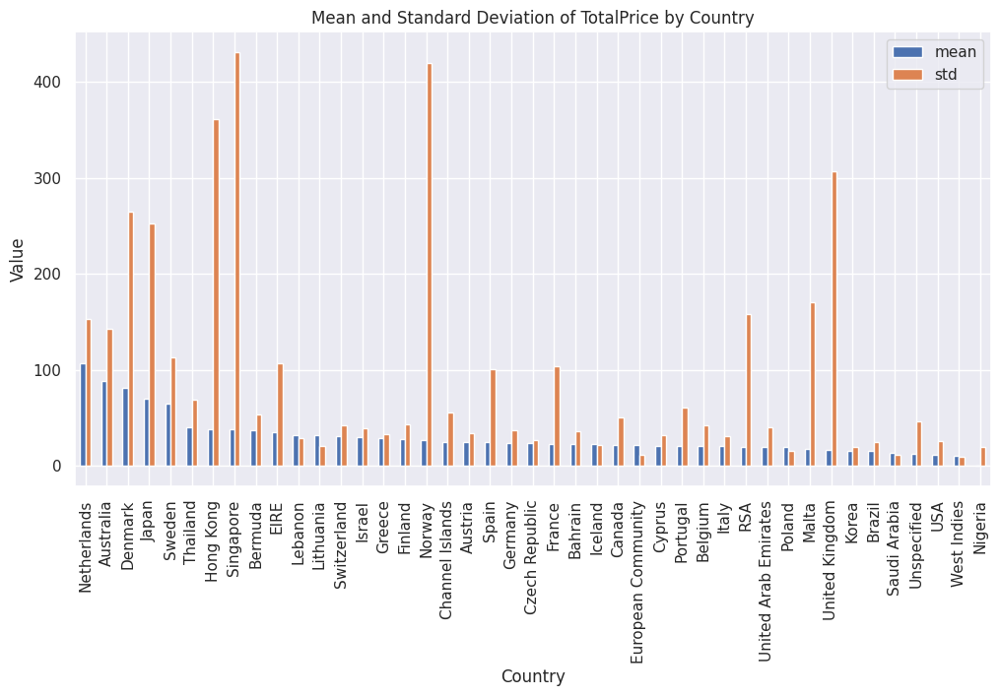

In [75]:
# Group by country and calculate mean and standard deviation of TotalPrice
country_stats = df.groupby('Country')['TotalPrice'].agg(['mean', 'std']).sort_values(by='mean', ascending=False).reset_index()

# Set the plot size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the bar chart
country_stats.plot(kind='bar', x='Country', y=['mean', 'std'], ax=ax, legend=True)

# Set title, x-axis label, and y-axis label
plt.title('Mean and Standard Deviation of TotalPrice by Country')
plt.xlabel('Country')
plt.ylabel('Value')

# Display the plot
plt.show()


In [76]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Quarter', 'Month',
       'Week', 'Day', 'TotalPrice', 'YearQuarter', 'YearMonth', 'Date',
       'DayOfWeek'],
      dtype='object')

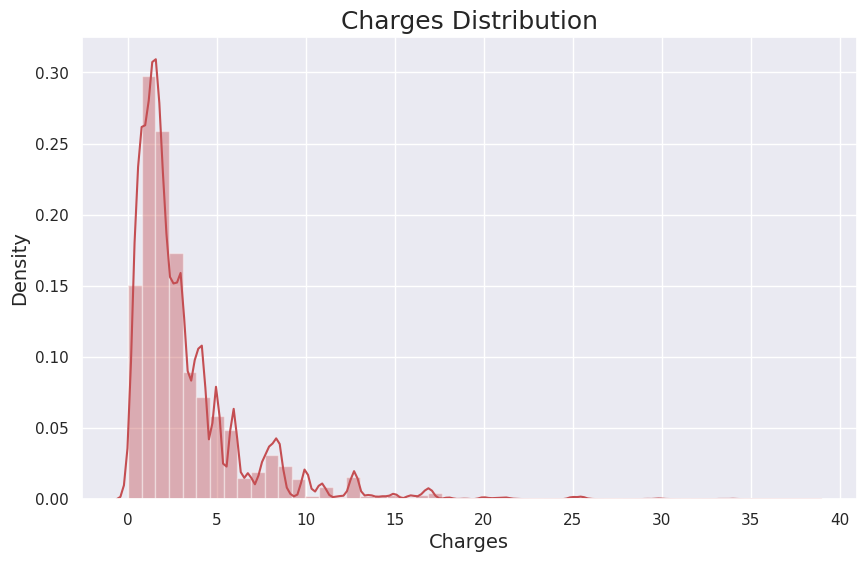

In [77]:
plt.figure(figsize=(10,6))
sns.distplot(df.UnitPrice,color='r')
plt.title('Charges Distribution',size=18)
plt.xlabel('Charges',size=14)
plt.ylabel('Density',size=14)
plt.show()

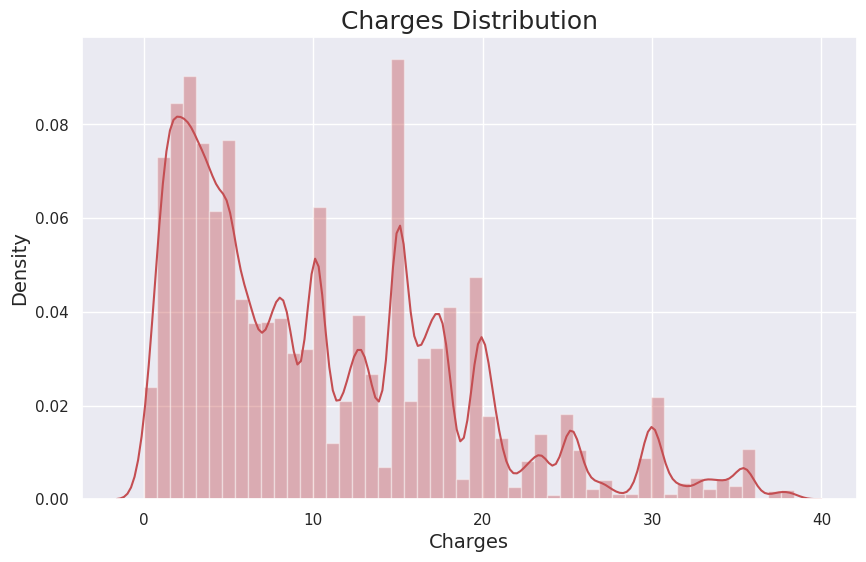

In [78]:
plt.figure(figsize=(10,6))
sns.distplot(df.TotalPrice,color='r')
plt.title('Charges Distribution',size=18)
plt.xlabel('Charges',size=14)
plt.ylabel('Density',size=14)
plt.show()

<Axes: >

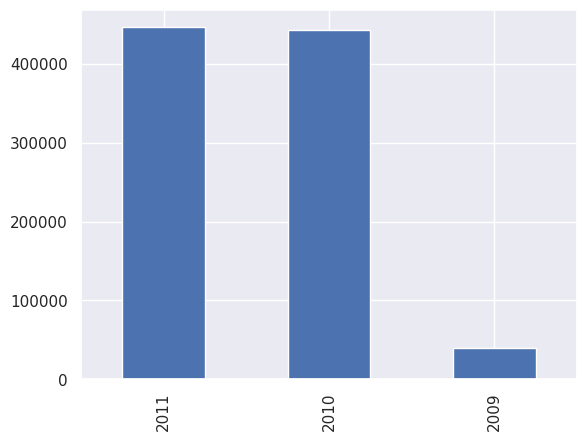

In [79]:
df['Year'].value_counts().plot(kind='bar')

<Axes: >

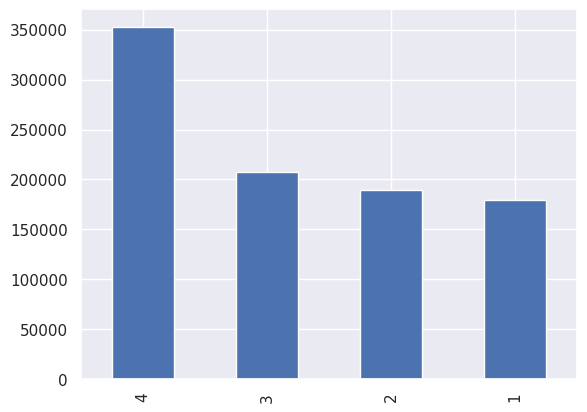

In [81]:
df['Quarter'].value_counts().plot(kind='bar')

<Axes: >

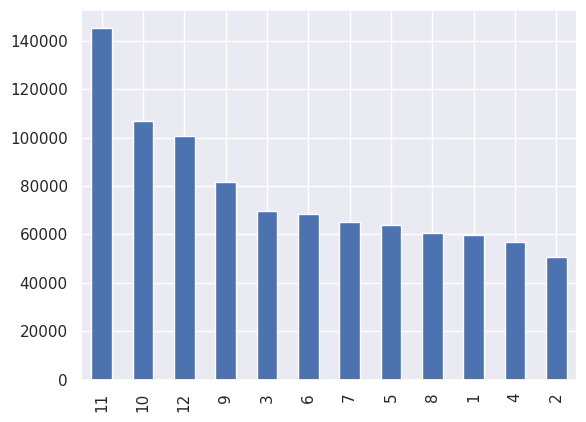

In [82]:
df['Month'].value_counts().plot(kind='bar')

<Axes: >

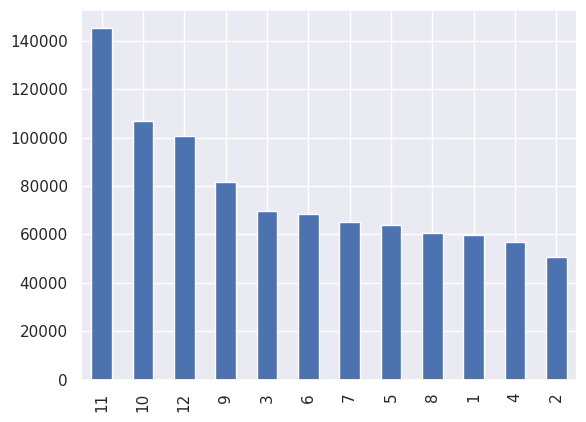

In [83]:
df['Month'].value_counts().plot(kind='bar')

In [85]:
df['Quantity'].nunique()

676

In [87]:
# Calculate correlation matrix
correlation_matrix = df.corr()

# Display the correlation matrix
display(correlation_matrix)

,Quantity,UnitPrice,CustomerID,Year,Quarter,Month,Week,Day,TotalPrice
Quantity,1.000000,-0.046981,0.051247,0.002788,0.000821,0.000299,0.000468,0.002668,0.077387
UnitPrice,-0.046981,1.000000,-0.210528,-0.034628,-0.015064,-0.010040,-0.009065,0.000424,0.304089
CustomerID,0.051247,-0.210528,1.000000,-0.017164,0.023590,0.019131,0.016014,0.010707,0.195140
Year,0.002788,-0.034628,-0.017164,1.000000,-0.116461,-0.151107,-0.148661,0.053338,-0.006398
Quarter,0.000821,-0.015064,0.023590,-0.116461,1.000000,0.973018,0.970983,-0.089707,-0.014706
Month,0.000299,-0.010040,0.019131,-0.151107,0.973018,1.000000,0.996583,-0.113283,-0.013642
Week,0.000468,-0.009065,0.016014,-0.148661,0.970983,0.996583,1.000000,-0.033822,-0.012978
Day,0.002668,0.000424,0.010707,0.053338,-0.089707,-0.113283,-0.033822,1.000000,0.005877
TotalPrice,0.077387,0.304089,0.195140,-0.006398,-0.014706,-0.013642,-0.012978,0.005877,1.000000


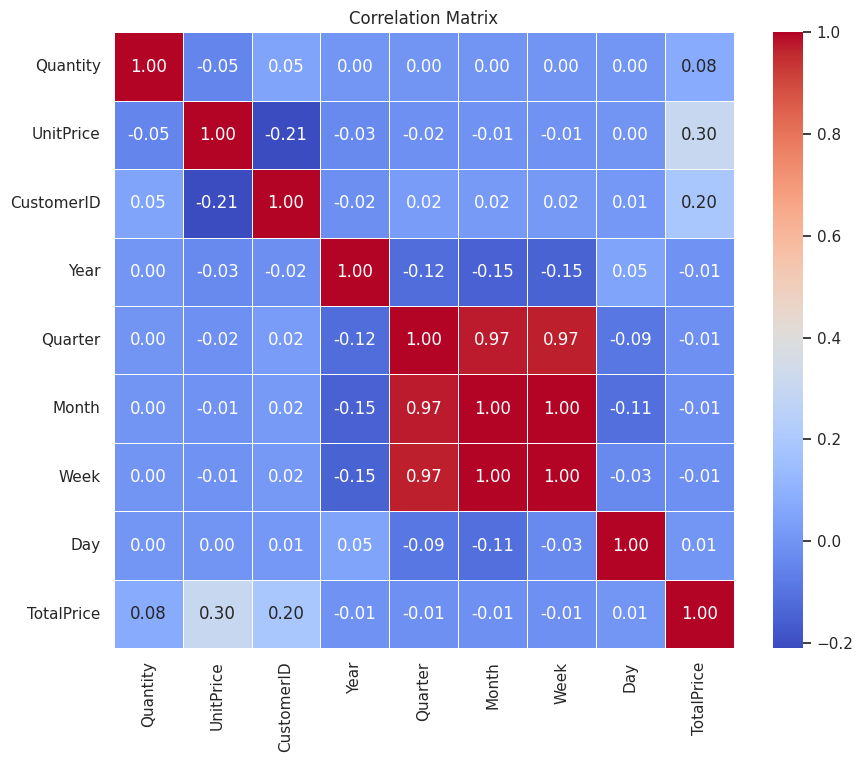

In [88]:
# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# There are no correlation between the columns

In [ ]:
# https://medium.com/@ugursavci/complete-exploratory-data-analysis-using-python-9f685d67d1e4 need to do this

# RFM
RFM (Recency, Frequency, Monetary Value) is a marketing analysis model that categorizes customers based on their recent activity, purchase frequency, and monetary contributions. It helps businesses identify segments like high-value customers for targeted marketing, re-engage at-risk customers, and tailor strategies based on customer behavior.
RECENCY (R): Days since last purchase  
FREQUENCY (F): Total number of purchases  
MONETARY VALUE (M): Total money this customer spent.  

In [ ]:
last_date=df['Date'].max()

In [ ]:
from scipy import stats

# Assuming 'data' is your DataFrame and 'column_name' is the column with potential outliers
z_scores = stats.zscore(data['TotalPrice'])
outliers = data[(z_scores > 3) | (z_scores < -3)]

# Filter data excluding outliers
filtered_data = df[(z_scores <= 3) & (z_scores >= -3)]


In [ ]:
filtered_data.head()

In [ ]:
# Finding the customers and their last purchase date
recency=df.groupby('CustomerID')['Date'].max().reset_index()
display(recency.head())

In [ ]:
recency['Recency']=recency['Date'].apply(lambda x: (last_date-x).days)
display(recency.head())

We can see it has been 325 days since CustomerID 12346 purchased anything

In [ ]:
# Frequency

In [ ]:
# Find the number of time a custeomer has made a purchase
frequency=df.groupby('CustomerID')['InvoiceNo'].count().reset_index()
frequency.columns = ['CustomerID','Frequency']
display(frequency.head())

In [ ]:
# Monetary

In [ ]:
# Finding how much each customer has spent overall
monetary=df.groupby('CustomerID')['TotalPrice'].sum().reset_index()
monetary.columns = ['CustomerID','Monetary']
display(monetary.head())

In [ ]:
# Creating a RFM Table
rf_table = recency.merge(frequency, on='CustomerID')
rfm_table=rf_table.merge(monetary, on='CustomerID')
rfm=rfm_table.drop('Date', axis=1)
rfm=rfm[rfm['CustomerID']!=0]
display(rfm.head())

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for the plots
sns.set(style="whitegrid")

# Create a subplot layout
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plotting displots for Recency, Frequency, and Monetary
sns.histplot(rfm['Recency'], bins=20, kde=True, color='blue', ax=axes[0])
axes[0].set_title('Recency Distribution')
axes[0].set_xlabel('Recency')

sns.histplot(rfm['Frequency'], bins=20, kde=True, color='green', ax=axes[1])
axes[1].set_title('Frequency Distribution')
axes[1].set_xlabel('Frequency')

sns.histplot(rfm['Monetary'], bins=20, kde=True, color='orange', ax=axes[2])
axes[2].set_title('Monetary Distribution')
axes[2].set_xlabel('Monetary')

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Apply log transformation
rfm_log = np.log1p(rfm[['Recency', 'Frequency', 'Monetary']])

# Plot histograms of the log-transformed data
plt.figure(figsize=(15, 5))

# Recency
plt.subplot(1, 3, 1)
sns.histplot(rfm_log['Recency'], bins=20, kde=True, color='blue')
plt.title('Log-transformed Recency')

# Frequency
plt.subplot(1, 3, 2)
sns.histplot(rfm_log['Frequency'], bins=20, kde=True, color='green')
plt.title('Log-transformed Frequency')

# Monetary
plt.subplot(1, 3, 3)
sns.histplot(rfm_log['Monetary'], bins=20, kde=True, color='orange')
plt.title('Log-transformed Monetary')

plt.tight_layout()
plt.show()


In [ ]:
# Customer Segmentation using K-Means clustering (RFM)
# First i need to find the optimal number of Clusters

In [ ]:
# Elbow Method
# In the Elbow Method graph, look for the point where the inertia (within-cluster sum of squares)
# starts decreasing at a slower rate. This point is known as the "elbow." The optimal number of clusters
# is often located at the elbow, as it represents a balance between minimizing intra-cluster distance and
# avoiding excessive clusters.

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertias = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_log)  # 'data' is your RFM table
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


In [ ]:
# By the looks of it, The optimal number of Clusters is 3

In [ ]:
# Silhouette Score
# In the Silhouette Score graph, aim to find the K value that results in the highest silhouette score.
# The silhouette score measures how similar an object is to its own cluster compared to other clusters.
# Higher silhouette scores indicate well-defined clusters.

# In this example, the highest silhouette score occurs at K=3. Thus, the optimal number of clusters is likely 3.
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(rfm_log)  # 'data' is your RFM table
    score = silhouette_score(rfm_log, labels)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal K')
plt.show()


In [ ]:
# From the graph, 2 is the optimal number of clusters

In [ ]:
from gap_statistic import OptimalK

optimalK = OptimalK(parallel_backend='multiprocessing')
n_clusters = optimalK(rfm_log, cluster_array=np.arange(1, 11))
print(f'Optimal number of clusters: {n_clusters}')


In [ ]:
# All 3 are giving different number of clusters, so i'll take the avg of it. So the ideal number of clusters is 4

In [ ]:
from sklearn.cluster import KMeans

n_clusters=4
# Selecting only the relevant columns for clustering
rfm_for_clustering = rfm_log[['Recency', 'Frequency', 'Monetary']]

# Initializing KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fitting the KMeans model to your data
rfm['Cluster'] = kmeans.fit_predict(rfm_for_clustering)

# Displaying the resulting clusters in your DataFrame
print(rfm.head())


In [ ]:
rfm['Cluster'].value_counts()

In [ ]:
rfm.groupby('Cluster').mean()

In [ ]:
# Cluster 0 is the High-Value Customers (Champions)
# clsuter 1 is the Potential Loyalists (Loyal Customers)
# cluster 2 is At-Risk Customers (Needs Attention)
# Clsuter 3 is the Lost Customers (Require Re-engagement)

In [ ]:
# How do cancellations impact overall sales trends?

In [ ]:
data['IsCancelled'] = data['InvoiceNo'].astype(str).str.startswith('C')
data.head()

In [ ]:
data.columns

In [ ]:
# Create a new DataFrame with monthly sales data
monthly_sales_data = data.groupby(pd.Grouper(key='InvoiceDate', freq='M')).agg(
    monthly_total_sales=('TotalPrice', 'sum'),
    monthly_cancellations=('TotalPrice', lambda x: x[data['IsCancelled']].sum()),
)

# Calculate monthly_net_sales by adding total sales and cancellations
monthly_sales_data['monthly_net_sales'] = (
    monthly_sales_data['monthly_total_sales'] + monthly_sales_data['monthly_cancellations']
)

# Reset index to make the 'InvoiceDate' a regular column
monthly_sales_data.reset_index(inplace=True)

# Display the resulting DataFrame
print(monthly_sales_data)

In [ ]:
import matplotlib.pyplot as plt

# Plotting Monthly Total Sales, Cancellations, and Net Sales
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_total_sales'], label='Total Sales')
plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_cancellations'], label='Cancellations', linestyle='dashed', color='red')
plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_net_sales'], label='Net Sales', linestyle='dashed', color='green')

plt.xlabel('Month')
plt.ylabel('Amount')
plt.title('Monthly Total Sales, Cancellations, and Net Sales')
plt.legend()
plt.show()


In [ ]:

# What are the most bought products
# How many online customers are there in the dataset and what is their country of origin?

# Calculate the revenue that was made in each month and what is the percentage revenue based on countries?

# Build a machine learning model to estimate if a given customer will buy something again from the online shop in the next quarter.


# See if theres relation between number of invoice and total money spent

In [ ]:
STOP

In [ ]:
data.shape

In [ ]:
(f'''{more_than_zero.shape},
{less_than_zero.shape},
{filtered_data.shape},
{cancelled.shape},
{data.shape}''')